##Setup

You will need to make a copy of this notebook in your Google Drive before you can edit the homework files. You can do so with **File &rarr; Save a copy in Drive**. Please run on GPU: Runtime -> Change runtime type -> Hardware accelerator -> T4 GPU

In [1]:
#@title mount your Google Drive
#@markdown Your work will be stored in a folder called `hw_16831` by default to prevent Colab instance timeouts from deleting your edits.

import os
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
#@title set up mount symlink

DRIVE_PATH = '/content/gdrive/My\ Drive/hw_16831'
DRIVE_PYTHON_PATH = DRIVE_PATH.replace('\\', '')
if not os.path.exists(DRIVE_PYTHON_PATH):
  %mkdir $DRIVE_PATH

## the space in `My Drive` causes some issues,
## make a symlink to avoid this
SYM_PATH = '/content/hw_16831'
if not os.path.exists(SYM_PATH):
  !ln -s $DRIVE_PATH $SYM_PATH

<>:3: SyntaxWarning: invalid escape sequence '\ '
<>:3: SyntaxWarning: invalid escape sequence '\ '
/tmp/ipython-input-3425321108.py:3: SyntaxWarning: invalid escape sequence '\ '
  DRIVE_PATH = '/content/gdrive/My\ Drive/hw_16831'


In [3]:
#@title apt install requirements

#@markdown Run each section with Shift+Enter

#@markdown Double-click on section headers to show code.

!apt update
!apt install -y --no-install-recommends \
        build-essential \
        curl \
        git \
        gnupg2 \
        make \
        cmake \
        ffmpeg \
        swig \
        libz-dev \
        unzip \
        zlib1g-dev \
        libglfw3 \
        libglfw3-dev \
        libxrandr2 \
        libxinerama-dev \
        libxi6 \
        libxcursor-dev \
        libgl1-mesa-dev \
        libgl1-mesa-glx \
        libglew-dev \
        libosmesa6-dev \
        lsb-release \
        ack-grep \
        patchelf \
        wget \
        xpra \
        xserver-xorg-dev \
        xvfb \
        python3-opengl \
        ffmpeg

Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,632 B]
Get:2 https://cli.github.com/packages stable InRelease [3,917 B]
Get:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Get:4 https://cli.github.com/packages stable/main amd64 Packages [356 B]
Hit:5 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:6 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:7 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Get:8 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ Packages [83.8 kB]
Get:9 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:10 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [2,341 kB]
Get:11 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease [18.1 kB]
Get:12 https://r2u.stat.illinois.edu/ubuntu jammy/main amd64 Packages [2,890 kB]
Get:13 http://archive.ubuntu.com/ubuntu jammy-bac

In [4]:
#@title clone homework repo

%cd $SYM_PATH
!git clone https://github.com/namanxkumar/16831_hw.git
%cd 16831_hw/hw1
%pip install -r requirements_colab.txt
%pip install -e .

/content/gdrive/My Drive/hw_16831
fatal: destination path '16831_hw' already exists and is not an empty directory.
/content/gdrive/My Drive/hw_16831/16831_hw/hw1
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 732.2/732.2 kB 20.5 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.9/5.9 MB 123.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 125.4/125.4 kB 16.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 108.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 95.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.6/162.6 kB 19.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 131.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 781.3/781.3 kB 60.4 MB/s eta 0:00:00
  Created wheel for gym: filename=gym-0.25.1-py3-none-any.whl size=8

Obtaining file:///content/gdrive/My%20Drive/hw_16831/16831_hw/hw1
  Preparing metadata (setup.py) ... done
  Running setup.py develop for rob831


In [5]:
# downloads mujoco from source
!wget https://mujoco.org/download/mujoco210-linux-x86_64.tar.gz
!tar xzvf mujoco210-linux-x86_64.tar.gz
!mkdir -p ~/.mujoco
!mv mujoco210 ~/.mujoco/mujoco210
!rm mujoco*

%pip install -U mujoco
%pip install -U 'mujoco-py<2.2,>=2.1'
%pip install -U pyvirtualdisplay
%pip install -U gym-notebook-wrapper
%pip install -U "cython<3"
%pip install -U "numpy<2.0"

!cp /root/.mujoco/mujoco210/bin/*.so /usr/lib/x86_64-linux-gnu/

--2026-02-04 17:51:44--  https://mujoco.org/download/mujoco210-linux-x86_64.tar.gz
Resolving mujoco.org (mujoco.org)... 216.239.34.21, 216.239.38.21, 216.239.36.21, ...
Connecting to mujoco.org (mujoco.org)|216.239.34.21|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://github.com/google-deepmind/mujoco/releases/download/2.1.0/mujoco210-linux-x86_64.tar.gz [following]
--2026-02-04 17:51:45--  https://github.com/google-deepmind/mujoco/releases/download/2.1.0/mujoco210-linux-x86_64.tar.gz
Resolving github.com (github.com)... 140.82.113.3
Connecting to github.com (github.com)|140.82.113.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://release-assets.githubusercontent.com/github-production-release-asset/400501136/1f51148e-4e64-4a12-a400-d6f1e21be444?sp=r&sv=2018-11-09&sr=b&spr=https&se=2026-02-04T18%3A47%3A59Z&rscd=attachment%3B+filename%3Dmujoco210-linux-x86_64.tar.gz&rsct=application%2Foctet-stream&s

In [1]:
# set env variables
import os
os.environ['LD_LIBRARY_PATH'] += ':/root/.mujoco/mujoco210/bin'
os.environ['MUJOCO_PY_MUJOCO_PATH'] = '/root/.mujoco/mujoco210'
os.environ['LD_LIBRARY_PATH'] += ':/usr/lib/nvidia'

In [2]:
#@title set up virtual display

from pyvirtualdisplay import Display

display = Display(visible=0, size=(1400, 900))
display.start()

In [3]:
#@title test virtual display

#@markdown If you see a video of a four-legged ant fumbling about, setup is complete!

import numpy as np
if not hasattr(np, "bool8"):
    np.bool8 = np.bool_

import gym
import gnwrapper

env = gnwrapper.LoopAnimation(gym.make('Ant-v2'))

observation = env.reset()
for i in range(100):
    obs, rew, term, _ = env.step(env.action_space.sample())
    env.render()
    if term:
      break

env.display()
env.close()

/tmp/ipython-input-2639057867.py:6: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not hasattr(np, "bool8"):
Gym has been unmaintained since 2022 and does not support NumPy 2.0 amongst other critical functionality.
Please upgrade to Gymnasium, the maintained drop-in replacement of Gym, or contact the authors of your software and request that they upgrade.
See the migration guide at https://gymnasium.farama.org/introduction/migration_guide/ for additional information.
/usr/local/lib/python3.12/dist-packages/gym/envs/registration.py:593: UserWarning: WARN: The environment Ant-v2 is out of date. You should consider upgrading to version `v4`.
  logger.warn(
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return dat

Compiling /usr/local/lib/python3.12/dist-packages/mujoco_py/cymj.pyx because it depends on /usr/local/lib/python3.12/dist-packages/numpy/__init__.pxd.
[1/1] Cythonizing /usr/local/lib/python3.12/dist-packages/mujoco_py/cymj.pyx


INFO:root:running build_ext
INFO:root:building 'mujoco_py.cymj' extension
INFO:root:creating /usr/local/lib/python3.12/dist-packages/mujoco_py/generated/_pyxbld_2.1.2.14_312_linuxcpuextensionbuilder/temp.linux-x86_64-cpython-312/usr/local/lib/python3.12/dist-packages/mujoco_py
INFO:root:creating /usr/local/lib/python3.12/dist-packages/mujoco_py/generated/_pyxbld_2.1.2.14_312_linuxcpuextensionbuilder/temp.linux-x86_64-cpython-312/usr/local/lib/python3.12/dist-packages/mujoco_py/gl
INFO:root:x86_64-linux-gnu-gcc -fno-strict-overflow -Wsign-compare -DNDEBUG -g -O2 -Wall -g -fstack-protector-strong -Wformat -Werror=format-security -g -fwrapv -O2 -fPIC -I/usr/local/lib/python3.12/dist-packages/mujoco_py -I/root/.mujoco/mujoco210/include -I/usr/local/lib/python3.12/dist-packages/numpy/core/include -I/usr/include/python3.12 -c /usr/local/lib/python3.12/dist-packages/mujoco_py/cymj.c -o /usr/local/lib/python3.12/dist-packages/mujoco_py/generated/_pyxbld_2.1.2.14_312_linuxcpuextensionbuilder/te

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


## Editing Code

To edit code, click the folder icon on the left menu. Navigate to the corresponding file (`hw_16831/...`). Double click a file to open an editor. There is a timeout of about ~12 hours with Colab while it is active (and less if you close your browser window). We sync your edits to Google Drive so that you won't lose your work in the event of an instance timeout, but you will need to re-mount your Google Drive and re-install packages with every new instance.

**IMPORTANT**: Please re-run the following cell before every code run.

In [144]:
%cd /content/hw_16831/16831_hw/
!git pull

/content/gdrive/My Drive/hw_16831/16831_hw
remote: Enumerating objects: 11, done.
remote: Counting objects: 100% (11/11), done.
remote: Compressing objects: 100% (2/2), done.
remote: Total 6 (delta 4), reused 6 (delta 4), pack-reused 0 (from 0)
Unpacking objects: 100% (6/6), 512 bytes | 6.00 KiB/s, done.
From https://github.com/namanxkumar/16831_hw
   3f5694f..139c1d6  main       -> origin/main
Updating 3f5694f..139c1d6
Fast-forward
 hw1/rob831/infrastructure/rl_trainer.py | 5 ++++-
 1 file changed, 4 insertions(+), 1 deletion(-)


In [145]:
#@title imports
#@markdown Please re-run this cell before every code run

import os
import time
import importlib

import rob831.policies.MLP_policy
import rob831.policies.loaded_gaussian_policy
import rob831.agents.bc_agent
import rob831.infrastructure.rl_trainer
import rob831.infrastructure.utils

importlib.reload(rob831.policies.MLP_policy)
importlib.reload(rob831.policies.loaded_gaussian_policy)
importlib.reload(rob831.agents.bc_agent)
importlib.reload(rob831.infrastructure.rl_trainer)
importlib.reload(rob831.infrastructure.utils)

from rob831.infrastructure.rl_trainer import RL_Trainer
from rob831.agents.bc_agent import BCAgent
from rob831.policies.loaded_gaussian_policy import LoadedGaussianPolicy

## Run Behavior Cloning (Problem 1)

In [180]:
#@title runtime arguments

class Args:

  def __getitem__(self, key):
    return getattr(self, key)

  def __setitem__(self, key, val):
    setattr(self, key, val)

  #@markdown expert data
  expert_policy_file = 'rob831/policies/experts/Ant.pkl' #@param
  expert_data = 'rob831/expert_data/expert_data_Ant-v2.pkl' #@param
  env_name = 'Ant-v2' #@param ['Ant-v2', 'Humanoid-v2', 'Walker2d-v2', 'HalfCheetah-v2', 'Hopper-v2']
  exp_name = 'test_bc_dagger_2' #@param
  do_dagger = True #@param {type: "boolean"}
  ep_len = 1000 #@param {type: "integer"}
  save_params = False #@param {type: "boolean"}

  num_agent_train_steps_per_iter = 1000 #@param {type: "integer"})
  n_iter = 10 #@param {type: "integer"})

  #@markdown batches & buffers
  batch_size = 1000 #@param {type: "integer"})
  eval_batch_size = 5000 #@param {type: "integer"}
  train_batch_size = 100 #@param {type: "integer"}
  max_replay_buffer_size = 100000 #@param {type: "integer"}

  #@markdown network
  n_layers = 2 #@param {type: "integer"}
  size = 64 #@param {type: "integer"}
  learning_rate = 5e-3 #@param {type: "number"}

  #@markdown logging
  video_log_freq = 5 #@param {type: "integer"}
  scalar_log_freq = 1 #@param {type: "integer"}

  #@markdown gpu & run-time settings
  no_gpu = False #@param {type: "boolean"}
  which_gpu = 0 #@param {type: "integer"}
  seed = 1 #@param {type: "integer"}

args = Args()


In [181]:
#@title define `BC_Trainer`
class BC_Trainer(object):

    def __init__(self, params):
        #######################
        ## AGENT PARAMS
        #######################

        agent_params = {
            'n_layers': params['n_layers'],
            'size': params['size'],
            'learning_rate': params['learning_rate'],
            'max_replay_buffer_size': params['max_replay_buffer_size'],
            }

        self.params = params
        self.params['agent_class'] = BCAgent ## TODO: look in here and implement this
        self.params['agent_params'] = agent_params

        ################
        ## RL TRAINER
        ################

        self.rl_trainer = RL_Trainer(self.params) ## TODO: look in here and implement this

        #######################
        ## LOAD EXPERT POLICY
        #######################

        print('Loading expert policy from...', self.params['expert_policy_file'])
        self.loaded_expert_policy = LoadedGaussianPolicy(self.params['expert_policy_file'])
        print('Done restoring expert policy...')

    def run_training_loop(self):

        self.rl_trainer.run_training_loop(
            n_iter=self.params['n_iter'],
            initial_expertdata=self.params['expert_data'],
            collect_policy=self.rl_trainer.agent.actor,
            eval_policy=self.rl_trainer.agent.actor,
            relabel_with_expert=self.params['do_dagger'],
            expert_policy=self.loaded_expert_policy,
        )


In [182]:
#@title create directory for logging

if args.do_dagger:
    logdir_prefix = 'q2_'
    assert args.n_iter>1, ('DAgger needs more than 1 iteration (n_iter>1) of training, to iteratively query the expert and train (after 1st warmstarting from behavior cloning).')
else:
    logdir_prefix = 'q1_'
    assert args.n_iter==1, ('Vanilla behavior cloning collects expert data just once (n_iter=1)')

data_path ='/content/hw_16831/hw1/data'
if not (os.path.exists(data_path)):
    os.makedirs(data_path)
logdir = logdir_prefix + args.exp_name + '_' + args.env_name + \
         '_' + time.strftime("%d-%m-%Y_%H-%M-%S")
logdir = os.path.join(data_path, logdir)
args['logdir'] = logdir
if not(os.path.exists(logdir)):
    os.makedirs(logdir)

In [174]:
%cd /content/hw_16831/16831_hw/hw1/

/content/gdrive/My Drive/hw_16831/16831_hw/hw1


In [175]:
import pickle
import numpy as np

with open(args.expert_data, 'rb') as f:
    expert_data_f = pickle.load(f)

# Each path has a 'reward' array - sum to get return
returns = [path['reward'].sum() for path in expert_data_f]

MEAN_ANT_RETURN = np.mean(returns)
STD_ANT_RETURN = np.std(returns)

In [176]:
import pickle
import numpy as np

with open(args.expert_data, 'rb') as f:
    expert_data_f = pickle.load(f)

# Each path has a 'reward' array - sum to get return
returns = [path['reward'].sum() for path in expert_data_f]

MEAN_HUMANOID_RETURN = np.mean(returns)
STD_HUMANOID_RETURN = np.std(returns)

In [183]:
# Make sure you're in the 16831-F25-HW/hw1 folder when running this.
## run training
print(args.logdir)
trainer = BC_Trainer(args)
returns = trainer.run_training_loop()

  logger.warn(

  logger.warn(

  deprecation(

  deprecation(



/content/hw_16831/hw1/data/q2_test_bc_dagger_2_Humanoid-v2_04-02-2026_21-03-28
########################
logging outputs to  /content/hw_16831/hw1/data/q2_test_bc_dagger_2_Humanoid-v2_04-02-2026_21-03-28
########################
Using GPU id 0
Loading expert policy from... rob831/policies/experts/Humanoid.pkl
obs (1, 376) (1, 376)
Done restoring expert policy...


********** Iteration 0 ************

Training agent using sampled data from replay buffer...


  if not isinstance(terminated, (bool, np.bool8)):




Beginning logging procedure...



  scalar = float(scalar)

INFO:tensorboardX.summary:Summary name Training Loss is illegal; using Training_Loss instead.


Eval_AverageReturn : 273.1441345214844
Eval_StdReturn : 16.61745834350586
Eval_MaxReturn : 317.224853515625
Eval_MinReturn : 208.56980895996094
Eval_AverageEpLen : 51.597938144329895
Train_AverageReturn : 10344.517578125
Train_StdReturn : 20.9814453125
Train_MaxReturn : 10365.4990234375
Train_MinReturn : 10323.5361328125
Train_AverageEpLen : 1000.0
Train_EnvstepsSoFar : 0
TimeSinceStart : 15.91974925994873
Training Loss : 0.08500593900680542
Initial_DataCollection_AverageReturn : 10344.517578125
Done logging...




********** Iteration 1 ************


Relabelling collected observations with labels from an expert policy...

Training agent using sampled data from replay buffer...

Beginning logging procedure...



INFO:tensorboardX.summary:Summary name Training Loss is illegal; using Training_Loss instead.


Eval_AverageReturn : 232.83155822753906
Eval_StdReturn : 8.449790954589844
Eval_MaxReturn : 251.5345458984375
Eval_MinReturn : 213.22406005859375
Eval_AverageEpLen : 43.7304347826087
Train_AverageReturn : 278.47607421875
Train_StdReturn : 18.33647918701172
Train_MaxReturn : 310.02728271484375
Train_MinReturn : 247.3536834716797
Train_AverageEpLen : 52.5
Train_EnvstepsSoFar : 1050
TimeSinceStart : 34.77712321281433
Training Loss : 0.10108844190835953
Initial_DataCollection_AverageReturn : 10344.517578125
Done logging...




********** Iteration 2 ************


Relabelling collected observations with labels from an expert policy...

Training agent using sampled data from replay buffer...

Beginning logging procedure...



INFO:tensorboardX.summary:Summary name Training Loss is illegal; using Training_Loss instead.


Eval_AverageReturn : 308.7882995605469
Eval_StdReturn : 55.70567321777344
Eval_MaxReturn : 658.6741333007812
Eval_MinReturn : 235.63294982910156
Eval_AverageEpLen : 55.24175824175824
Train_AverageReturn : 232.74282836914062
Train_StdReturn : 10.109969139099121
Train_MaxReturn : 250.32705688476562
Train_MinReturn : 216.08152770996094
Train_AverageEpLen : 43.73913043478261
Train_EnvstepsSoFar : 2056
TimeSinceStart : 51.84998631477356
Training Loss : 0.0723794549703598
Initial_DataCollection_AverageReturn : 10344.517578125
Done logging...




********** Iteration 3 ************


Relabelling collected observations with labels from an expert policy...

Training agent using sampled data from replay buffer...

Beginning logging procedure...



INFO:tensorboardX.summary:Summary name Training Loss is illegal; using Training_Loss instead.


Eval_AverageReturn : 258.0976257324219
Eval_StdReturn : 21.642337799072266
Eval_MaxReturn : 318.7123718261719
Eval_MinReturn : 217.1166229248047
Eval_AverageEpLen : 48.58252427184466
Train_AverageReturn : 322.2041015625
Train_StdReturn : 68.58074188232422
Train_MaxReturn : 549.7402954101562
Train_MinReturn : 267.8906555175781
Train_AverageEpLen : 57.0
Train_EnvstepsSoFar : 3082
TimeSinceStart : 68.70910286903381
Training Loss : 0.11177781224250793
Initial_DataCollection_AverageReturn : 10344.517578125
Done logging...




********** Iteration 4 ************


Relabelling collected observations with labels from an expert policy...

Training agent using sampled data from replay buffer...

Beginning logging procedure...



INFO:tensorboardX.summary:Summary name Training Loss is illegal; using Training_Loss instead.


Eval_AverageReturn : 249.2001190185547
Eval_StdReturn : 25.1678466796875
Eval_MaxReturn : 330.6238708496094
Eval_MinReturn : 206.74398803710938
Eval_AverageEpLen : 47.22641509433962
Train_AverageReturn : 249.62232971191406
Train_StdReturn : 20.41208267211914
Train_MaxReturn : 298.60089111328125
Train_MinReturn : 218.04379272460938
Train_AverageEpLen : 47.18181818181818
Train_EnvstepsSoFar : 4120
TimeSinceStart : 86.60738611221313
Training Loss : 0.15750324726104736
Initial_DataCollection_AverageReturn : 10344.517578125
Done logging...




********** Iteration 5 ************



Relabelling collected observations with labels from an expert policy...

Training agent using sampled data from replay buffer...

Beginning logging procedure...



Saving train rollouts as videos...
Eval_AverageReturn : 317.92041015625
Eval_StdReturn : 27.778669357299805


INFO:tensorboardX.summary:Summary name Training Loss is illegal; using Training_Loss instead.


Eval_MaxReturn : 379.36907958984375
Eval_MinReturn : 238.54544067382812
Eval_AverageEpLen : 58.84705882352941
Train_AverageReturn : 256.2120056152344
Train_StdReturn : 28.64848518371582
Train_MaxReturn : 327.96588134765625
Train_MinReturn : 207.92288208007812
Train_AverageEpLen : 48.142857142857146
Train_EnvstepsSoFar : 5131
TimeSinceStart : 130.78578543663025
Training Loss : 0.1527191400527954
Initial_DataCollection_AverageReturn : 10344.517578125
Done logging...




********** Iteration 6 ************


Relabelling collected observations with labels from an expert policy...

Training agent using sampled data from replay buffer...

Beginning logging procedure...



INFO:tensorboardX.summary:Summary name Training Loss is illegal; using Training_Loss instead.


Eval_AverageReturn : 304.4305419921875
Eval_StdReturn : 26.521738052368164
Eval_MaxReturn : 364.79656982421875
Eval_MinReturn : 254.2620086669922
Eval_AverageEpLen : 55.505494505494504
Train_AverageReturn : 308.0455322265625
Train_StdReturn : 25.200946807861328
Train_MaxReturn : 379.6131591796875
Train_MinReturn : 268.4534912109375
Train_AverageEpLen : 57.333333333333336
Train_EnvstepsSoFar : 6163
TimeSinceStart : 148.5333592891693
Training Loss : 0.15545037388801575
Initial_DataCollection_AverageReturn : 10344.517578125
Done logging...




********** Iteration 7 ************


Relabelling collected observations with labels from an expert policy...

Training agent using sampled data from replay buffer...

Beginning logging procedure...



INFO:tensorboardX.summary:Summary name Training Loss is illegal; using Training_Loss instead.


Eval_AverageReturn : 316.6251220703125
Eval_StdReturn : 24.589048385620117
Eval_MaxReturn : 427.44097900390625
Eval_MinReturn : 257.32891845703125
Eval_AverageEpLen : 57.48863636363637
Train_AverageReturn : 313.35894775390625
Train_StdReturn : 24.651134490966797
Train_MaxReturn : 361.6341247558594
Train_MinReturn : 278.2939758300781
Train_AverageEpLen : 57.166666666666664
Train_EnvstepsSoFar : 7192
TimeSinceStart : 165.73175811767578
Training Loss : 0.16682596504688263
Initial_DataCollection_AverageReturn : 10344.517578125
Done logging...




********** Iteration 8 ************


Relabelling collected observations with labels from an expert policy...

Training agent using sampled data from replay buffer...

Beginning logging procedure...



INFO:tensorboardX.summary:Summary name Training Loss is illegal; using Training_Loss instead.


Eval_AverageReturn : 336.52191162109375
Eval_StdReturn : 52.83852005004883
Eval_MaxReturn : 488.9042663574219
Eval_MinReturn : 260.258056640625
Eval_AverageEpLen : 58.83529411764706
Train_AverageReturn : 313.4964904785156
Train_StdReturn : 23.222074508666992
Train_MaxReturn : 353.3175048828125
Train_MinReturn : 271.4473571777344
Train_AverageEpLen : 57.44444444444444
Train_EnvstepsSoFar : 8226
TimeSinceStart : 183.87851238250732
Training Loss : 0.1580124795436859
Initial_DataCollection_AverageReturn : 10344.517578125
Done logging...




********** Iteration 9 ************


Relabelling collected observations with labels from an expert policy...

Training agent using sampled data from replay buffer...

Beginning logging procedure...



INFO:tensorboardX.summary:Summary name Training Loss is illegal; using Training_Loss instead.


Eval_AverageReturn : 397.0174560546875
Eval_StdReturn : 70.2380599975586
Eval_MaxReturn : 674.8114013671875
Eval_MinReturn : 296.5444641113281
Eval_AverageEpLen : 68.72602739726027
Train_AverageReturn : 377.8916931152344
Train_StdReturn : 82.67901611328125
Train_MaxReturn : 550.8670654296875
Train_MinReturn : 281.1404724121094
Train_AverageEpLen : 64.8125
Train_EnvstepsSoFar : 9263
TimeSinceStart : 200.97840809822083
Training Loss : 0.23898731172084808
Initial_DataCollection_AverageReturn : 10344.517578125
Done logging...




  return datetime.utcnow().replace(tzinfo=utc)



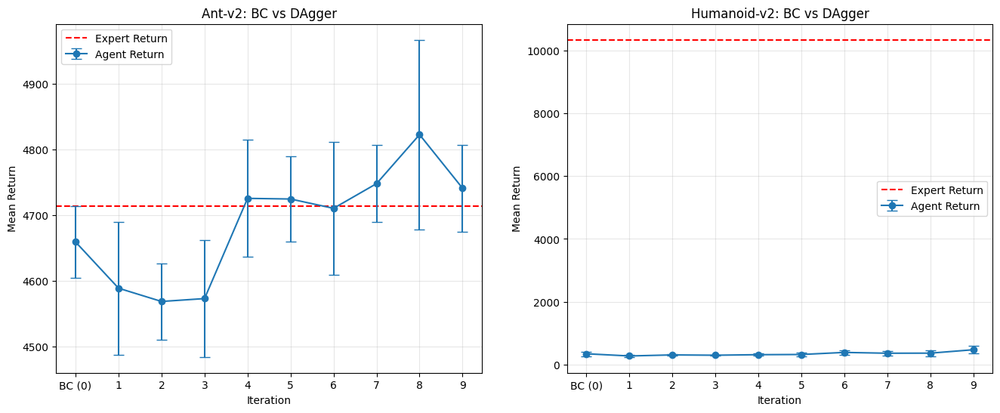

In [178]:
import matplotlib.pyplot as plt
import numpy as np

# Data for Ant
ant_expert = 4713.65
ant_iterations = np.arange(10)
ant_means = [4659.12, 4588.59, 4568.38, 4572.78, 4725.54, 4724.55, 4710.35, 4748.01, 4822.71, 4741.00]
ant_stds = [54.99, 101.22, 58.02, 88.93, 89.02, 64.99, 101.21, 59.02, 144.52, 65.90]

# Data for Humanoid
humanoid_expert = 10344.52
humanoid_iterations = np.arange(10)
humanoid_means = [342.18, 271.90, 305.73, 295.39, 312.90, 318.95, 384.95, 359.12, 361.91, 470.37]
humanoid_stds = [72.99, 30.39, 28.65, 20.60, 32.02, 53.69, 68.58, 69.69, 93.37, 119.53]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot Ant
ax1.axhline(y=ant_expert, color='r', linestyle='--', label='Expert Return')
ax1.errorbar(ant_iterations, ant_means, yerr=ant_stds, fmt='-o', capsize=5, label='Agent Return')
ax1.set_title('Ant-v2: BC vs DAgger')
ax1.set_xlabel('Iteration')
ax1.set_ylabel('Mean Return')
ax1.set_xticks(ant_iterations)
ax1.set_xticklabels(['BC (0)'] + [str(i) for i in range(1, 10)])
ax1.legend()
ax1.grid(True, alpha=0.3)

# Plot Humanoid
ax2.axhline(y=humanoid_expert, color='r', linestyle='--', label='Expert Return')
ax2.errorbar(humanoid_iterations, humanoid_means, yerr=humanoid_stds, fmt='-o', capsize=5, label='Agent Return')
ax2.set_title('Humanoid-v2: BC vs DAgger')
ax2.set_xlabel('Iteration')
ax2.set_ylabel('Mean Return')
ax2.set_xticks(humanoid_iterations)
ax2.set_xticklabels(['BC (0)'] + [str(i) for i in range(1, 10)])
ax2.legend()
ax2.grid(True, alpha=0.3)
plt.show()
# plt.tight_layout()
# plt.savefig('bc_dagger_plot.png')

  return datetime.utcnow().replace(tzinfo=utc)

  parse = parser.parseString(pattern)

  parser.resetCache()

  p.space          = oneOf(self._space_widths)("space")

  )("sym").leaveWhitespace()

  val.setName(key)

  val.setParseAction(getattr(self, key))

  p.text = cmd(r"\text", QuotedString('{', '\\', endQuoteChar="}"))

  p.math_string   = QuotedString('$', '\\', unquoteResults=False)

  result = self._expression.parseString(s)

  return fn(self, *args, **kwargs)

  ParserElement.resetCache()



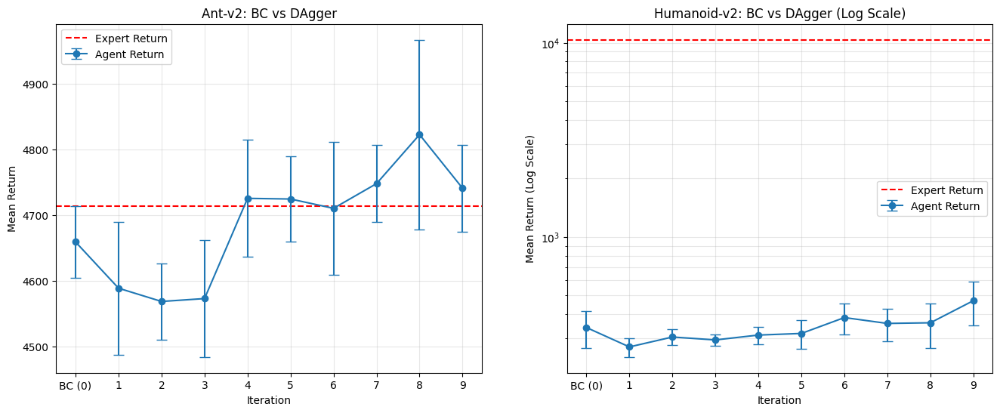

In [179]:
import matplotlib.pyplot as plt
import numpy as np

# Data for Ant
ant_expert = 4713.65
ant_iterations = np.arange(10)
ant_means = [4659.12, 4588.59, 4568.38, 4572.78, 4725.54, 4724.55, 4710.35, 4748.01, 4822.71, 4741.00]
ant_stds = [54.99, 101.22, 58.02, 88.93, 89.02, 64.99, 101.21, 59.02, 144.52, 65.90]

# Data for Humanoid
humanoid_expert = 10344.52
humanoid_iterations = np.arange(10)
humanoid_means = [342.18, 271.90, 305.73, 295.39, 312.90, 318.95, 384.95, 359.12, 361.91, 470.37]
humanoid_stds = [72.99, 30.39, 28.65, 20.60, 32.02, 53.69, 68.58, 69.69, 93.37, 119.53]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot Ant
ax1.axhline(y=ant_expert, color='r', linestyle='--', label='Expert Return')
ax1.errorbar(ant_iterations, ant_means, yerr=ant_stds, fmt='-o', capsize=5, label='Agent Return')
ax1.set_title('Ant-v2: BC vs DAgger')
ax1.set_xlabel('Iteration')
ax1.set_ylabel('Mean Return')
ax1.set_xticks(ant_iterations)
ax1.set_xticklabels(['BC (0)'] + [str(i) for i in range(1, 10)])
ax1.legend()
ax1.grid(True, alpha=0.3)

# Plot Humanoid (Log Scale)
ax2.axhline(y=humanoid_expert, color='r', linestyle='--', label='Expert Return')
ax2.errorbar(humanoid_iterations, humanoid_means, yerr=humanoid_stds, fmt='-o', capsize=5, label='Agent Return')
ax2.set_title('Humanoid-v2: BC vs DAgger (Log Scale)')
ax2.set_xlabel('Iteration')
ax2.set_ylabel('Mean Return (Log Scale)')
ax2.set_yscale('log') # Set y-axis to log scale
ax2.set_xticks(humanoid_iterations)
ax2.set_xticklabels(['BC (0)'] + [str(i) for i in range(1, 10)])
ax2.legend()
ax2.grid(True, alpha=0.3, which="both") # Grid for both major and minor ticks in log scale
plt.show()
# plt.tight_layout()
# plt.savefig('bc_dagger_log_plot.png')

In [158]:
ANT_RETURNS = returns

In [165]:
HUMANOID_RETURNS = returns

In [169]:
HUMANOID_RETURNS

In [184]:
#@markdown You can visualize your runs with tensorboard from within the notebook

%load_ext tensorboard
%tensorboard --logdir /content/hw_16831/hw1/data

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 5350), started 3:19:25 ago. (Use '!kill 5350' to kill it.)

<IPython.core.display.Javascript object>

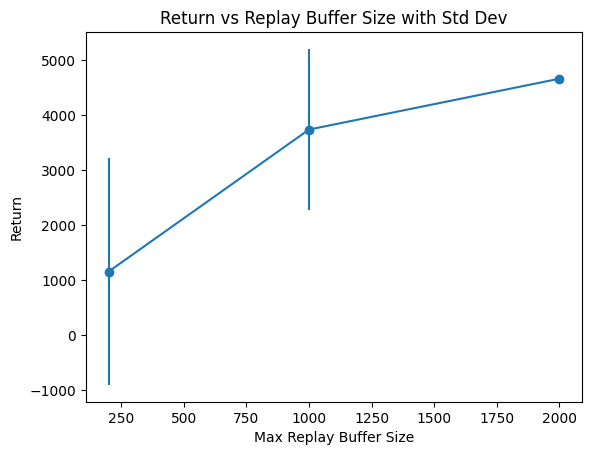

In [132]:
import matplotlib.pyplot as plt

# Given data
buffer_sizes = [200, 1000, 2000]
returns = [1152, 3734, 4659]
stds = [2060, 1466, 54.99]

plt.figure()
plt.errorbar(buffer_sizes, returns, yerr=stds, fmt='o-')
plt.xlabel("Max Replay Buffer Size")
plt.ylabel("Return")
plt.title("Return vs Replay Buffer Size with Std Dev")
plt.show()

## Running DAgger (Problem 2)
Modify the settings above:
1. check the `do_dagger` box
2. set `n_iters` to `10`
and then rerun the code.